In [1]:
%matplotlib inline

# 1. Getting Started with Image Processing

This and other volumes begin by stating that images are really matrices of pixel values blah blah blah...

In [4]:
!pip install scikit-image pillow numpy scipy matplotlib opencv-python

    100% |████████████████████████████████| 39.7MB 114kB/s ta 0:00:011  5% |█▉                              | 2.2MB 4.4MB/s eta 0:00:09    53% |█████████████████               | 21.1MB 1.6MB/s eta 0:00:12    58% |██████████████████▋             | 23.1MB 21.7MB/s eta 0:00:01    82% |██████████████████████████▌     | 32.9MB 4.5MB/s eta 0:00:02    83% |██████████████████████████▊     | 33.1MB 2.5MB/s eta 0:00:03    86% |███████████████████████████▋    | 34.3MB 6.7MB/s eta 0:00:01
You are using pip version 18.1, however version 19.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
import skimage, PIL, numpy
print(skimage.__version__)

0.14.2


In [8]:
print(PIL)

<module 'PIL' from '/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/PIL/__init__.py'>


In [3]:
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, viewer, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/skimage/viewer/__init__.py:6: UserWarning: Viewer requires Qt
  warn('Viewer requires Qt')


In [4]:
img = Image.open('./img/november.jpg')
print(img.width, img.height, img.mode, img.format, type(img))

5312 2988 RGB JPEG <class 'PIL.JpegImagePlugin.JpegImageFile'>


In [5]:
img.show()

In [6]:
img_g = img.convert('L')
img_g.save('./img/gray_november.jpg')
Image.open('./img/gray_november.jpg')

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [6]:
img = mpimg.imread("./img/shera.jpg")
print(img.shape, img.dtype, type(img))

(960, 720, 3) uint8 <class 'numpy.ndarray'>


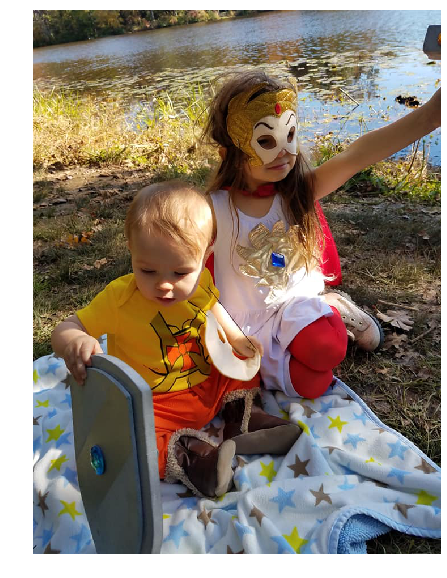

In [7]:
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show()

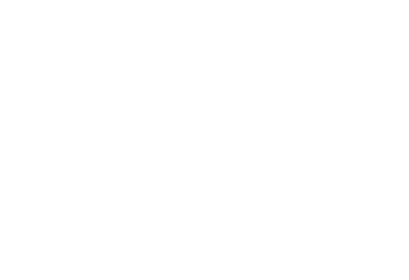

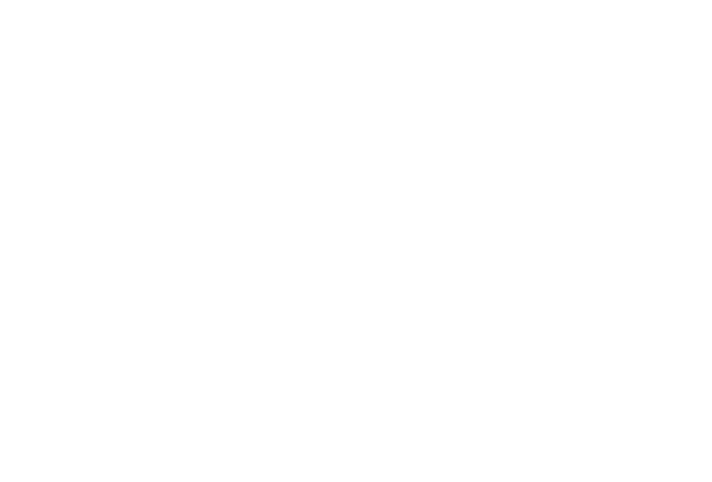

In [14]:
img1 = img
img1.setflags(write=1)
img1[img1 < 100] = 0  # book does 0.5, but look at the dtype, & it's int
plt.imshow(img1)
plt.axis('off')
plt.tight_layout()
plt.savefig('./img/shera_dark.jpg')
img = mpimg.imread('./img/shera_dark.jpg')
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

### Interpolation

Matplotlib's `imshow` can do some good work with interpolating pixels. If we have a small or pixelated image, then we can smooth it out a bit. Let's look at the kids above, but pixellated:

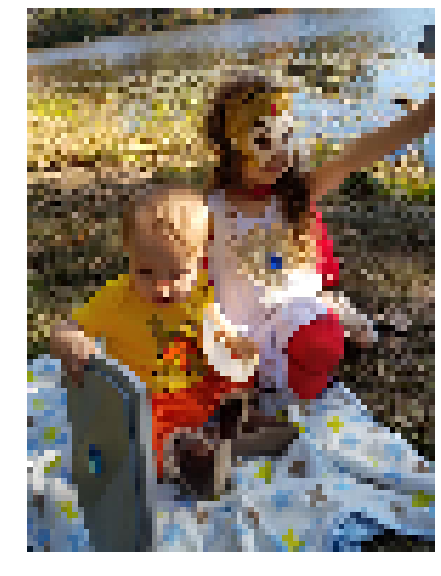

In [9]:
img = mpimg.imread('./img/shera.jpg')
a = img[::10, ::10]
plt.figure(figsize=(10, 10))
plt.imshow(a)
plt.axis('off')
plt.show()

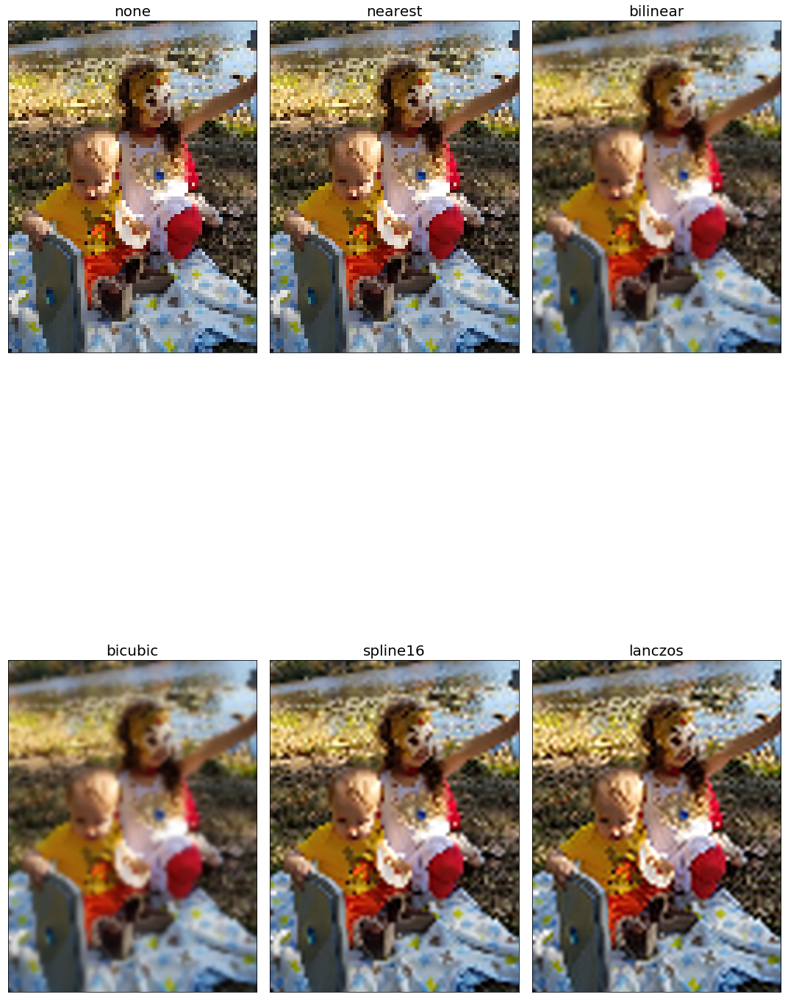

In [11]:
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 30),
 subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
 ax.imshow(a, interpolation=interp_method)
 ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()

### Using Scikit-Image

In [16]:
img = imread('./img/carousel.jpg')
print(img.shape, img.dtype, type(img))

(1080, 1440, 3) uint8 <class 'numpy.ndarray'>


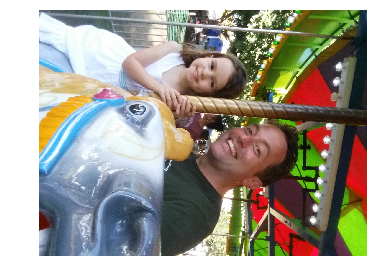

In [17]:
hsv = color.rgb2hsv(img)
plt.axis('off')
imshow(img)
show()

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/skimage/util/dtype.py:141: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


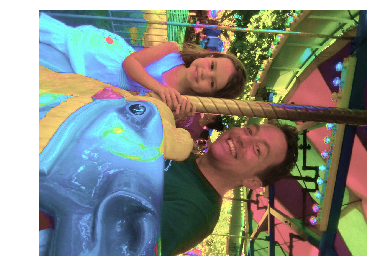

In [20]:
hsv[:, :, 1] = 0.5  # change saturation
img1 = color.hsv2rgb(hsv)  # ...and back to rgb -- necessary b/c show() expects rgb?
imsave('./img/carousel_hsv.jpg', img1)
img_hsv = imread('./img/carousel_hsv.jpg')
plt.axis('off')
imshow(img_hsv)
show()

In [23]:
import scipy
scipy.__version__

'1.2.0'

In [26]:
img = scipy.imread('./img/carousel.jpg')
print(type(img), img.shape, img.dtype)

AttributeError: module 'scipy' has no attribute 'imread'

Looks like we have to go with imageio then, so:

In [27]:
!pip install imageio

    100% |████████████████████████████████| 3.3MB 1.0MB/s ta 0:00:011    97% |███████████████████████████████▏| 3.3MB 3.5MB/s eta 0:00:01
  Running setup.py bdist_wheel for imageio ... done
  Stored in directory: /Users/ben/Library/Caches/pip/wheels/e0/43/31/605de9372ceaf657f152d3d5e82f42cf265d81db8bbe63cde1
Successfully built imageio
You are using pip version 18.1, however version 19.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [29]:
import imageio
img = imageio.imread('./img/carousel.jpg')
print(type(img), img.shape, img.dtype)

ModuleNotFoundError: No module named 'imageio'

In [30]:
!which pip

/Library/Frameworks/Python.framework/Versions/3.7/bin/pip


<em>grooooooo~~oooooaaaaan</em>... Apple is the worst.

In [31]:
!/Library/Frameworks/Python.framework/Versions/3.6/bin/pip install imageio

  Using cached https://files.pythonhosted.org/packages/28/b4/cbb592964dfd71a9de6a5b08f882fd334fb99ae09ddc82081dbb2f718c81/imageio-2.4.1.tar.gz
  Running setup.py bdist_wheel for imageio ... done
  Stored in directory: /Users/ben/Library/Caches/pip/wheels/e0/43/31/605de9372ceaf657f152d3d5e82f42cf265d81db8bbe63cde1
Successfully built imageio
You are using pip version 18.1, however version 19.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [32]:
import imageio
img = imageio.imread('./img/carousel.jpg')
print(type(img), img.shape, img.dtype)

<class 'imageio.core.util.Array'> (1440, 1080, 3) uint8


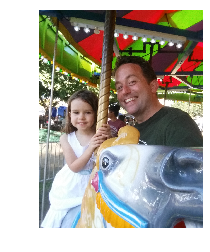

(<matplotlib.image.AxesImage at 0x12878fc88>,
 (-0.5, 1079.5, 1439.5, -0.5),
 None)

In [33]:
plt.imshow(img), plt.axis('off'), plt.show()

### Wow! They even auto-rotated it!

The Python community is the best

## Basic Image Manipulation

In [34]:
carousel = imageio.imread('./img/carousel.jpg')
print(carousel[0, 40])


[ 34  70 104]


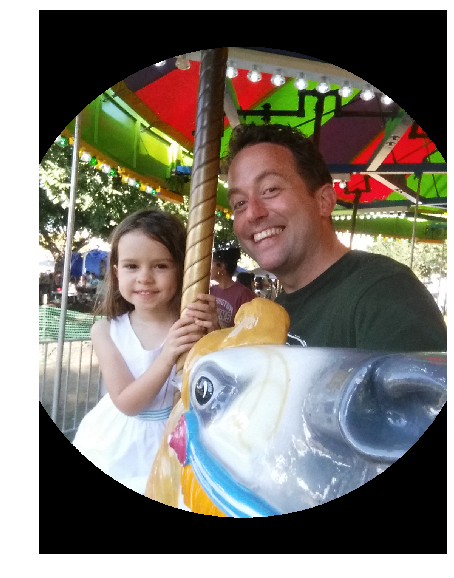

(<matplotlib.image.AxesImage at 0x10e72e2b0>,
 (-0.5, 1079.5, 1439.5, -0.5),
 None)

In [39]:
import numpy as np
lx, ly, _ = carousel.shape
X, Y = np.ogrid[0: lx, 0:ly]
mask = (X - lx /2) ** 2 + 2 + (Y - ly / 2) ** 2 > lx * ly / 4
carousel[mask, :] = 0
plt.figure(figsize=(10, 10))
plt.imshow(carousel), plt.axis('off'), plt.show()

### Image Morphing!

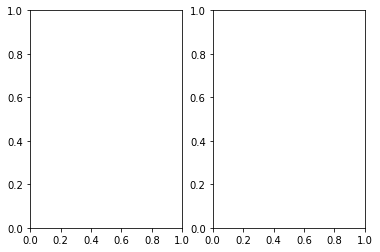

In [44]:
img1 = mpimg.imread('./img/november_small.jpg')
img2 = mpimg.imread('./img/Uli_small.jpg')


In [46]:
ax[0].plot(img1)
ax[1].plot(img2)

ValueError: x and y can be no greater than 2-D, but have shapes (2656,) and (2656, 1494, 3)

ValueError: operands could not be broadcast together with shapes (2656,1494,3) (1210,907,3) 

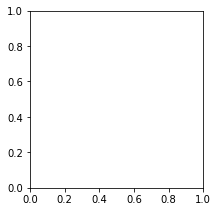

In [43]:
i = 1
plt.figure(figsize=(18, 15))
for alpha in np.linspace(0, 1, 20):
    plt.subplot(4, 5, i)
    plt.imshow((1-alpha)*img1 + alpha*img2)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

## Image Manipulations with PIL(low)


In [48]:
img = Image.open("./img/Uli_small.jpg")
print(img.width, img.height, img.mode, img.format)

907 1210 RGB JPEG


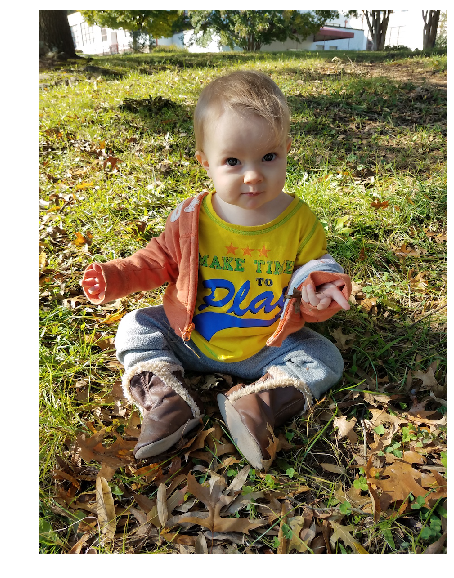

In [53]:
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show()

In [58]:
img_crop = img.crop((0, 120, 800, 1050))

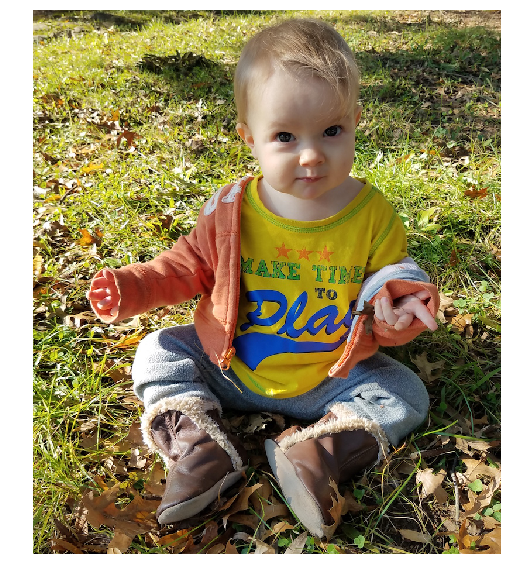

((-0.5, 799.5, 929.5, -0.5), None)

In [59]:
plt.figure(figsize=(10, 10))
plt.imshow(img_crop)
plt.axis('off'), plt.show()

In [61]:
print(img_crop.height, img_crop.width)
img_crop_large = img_crop.resize((img_crop.width*2, img_crop.height*2),
                                Image.BILINEAR)  # for smaller, Image.ANTIALIAS
print(img_crop_large.height, img_crop_large.width)

930 800
1860 1600


### Negating an Image

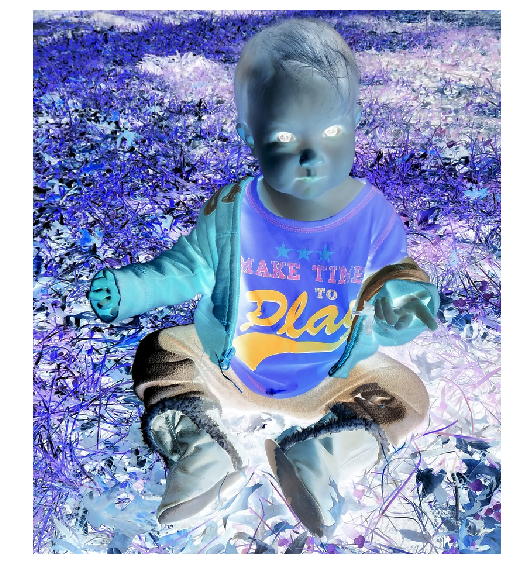

((-0.5, 799.5, 929.5, -0.5), None)

In [63]:
img_neg = img_crop.point(lambda x: 255 - x)
plt.figure(figsize=(10, 10))
plt.imshow(img_neg)
plt.axis('off'), plt.show()

OK, I'm tired of writing those lines out. Time to write a function to wrap them into one.

In [64]:
def img_show(img):
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off'), plt.show()

## Different Ways to Grayscale

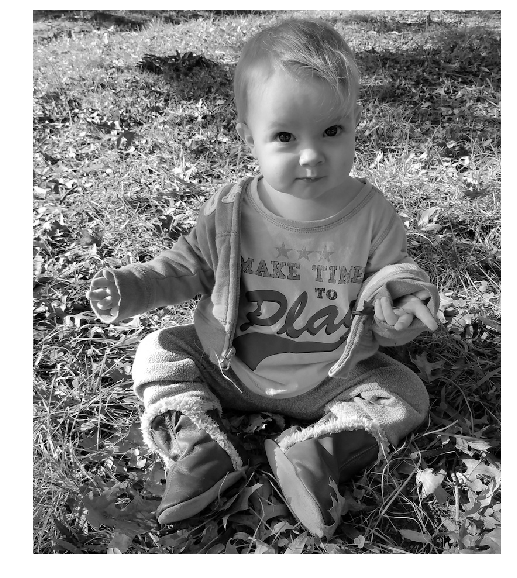

In [65]:
uli = img_crop
uli_gray = uli.convert('L')
img_show(uli_gray)

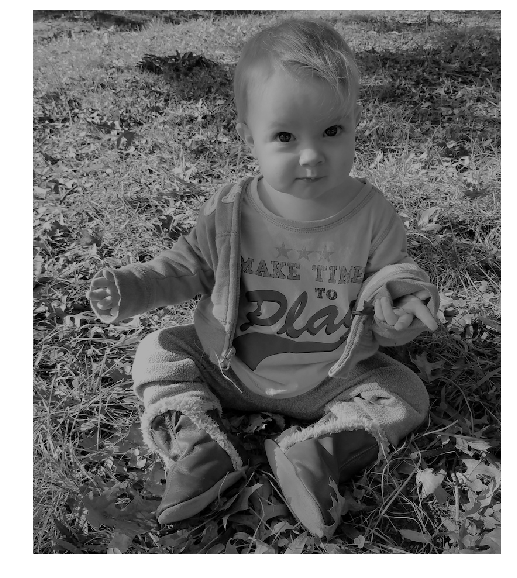

In [67]:
uli_log = uli_gray.point(lambda x: 255 * np.log(1 + x / 255))
img_show(uli_log)

So that's a little softer, because the pixel values are compressed toward the median value.

Next we'll look at the power-law transformation, where we see the $\gamma$ correction, which "corrects" the lens's distribution of pixel values to more accurately reflect the way that humans perceive light or dark.

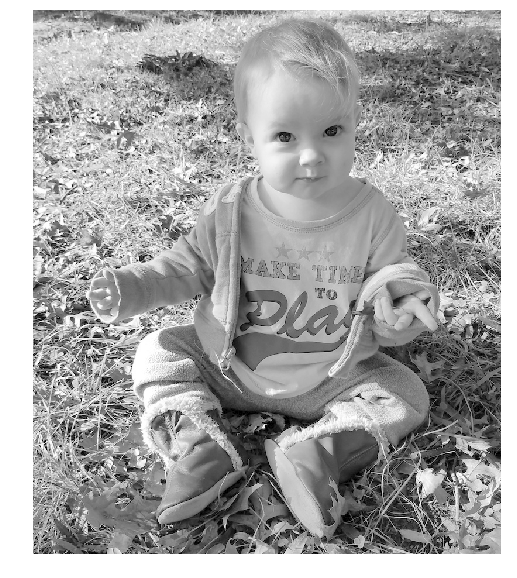

In [68]:
gamma = 0.6
uli_gamma = uli_gray.point(lambda x: 255 * (x / 255) ** gamma)
img_show(uli_gamma)

## Some Geometric Transformations

### Reflecting an Image

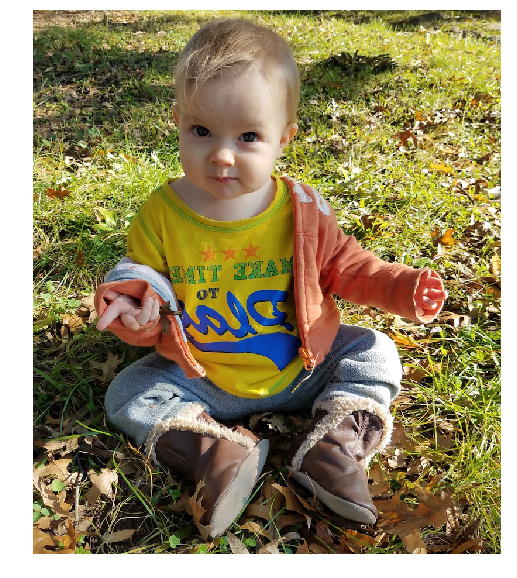

In [70]:
uli_reflected = uli.transpose(Image.FLIP_LEFT_RIGHT)
img_show(uli_reflected)

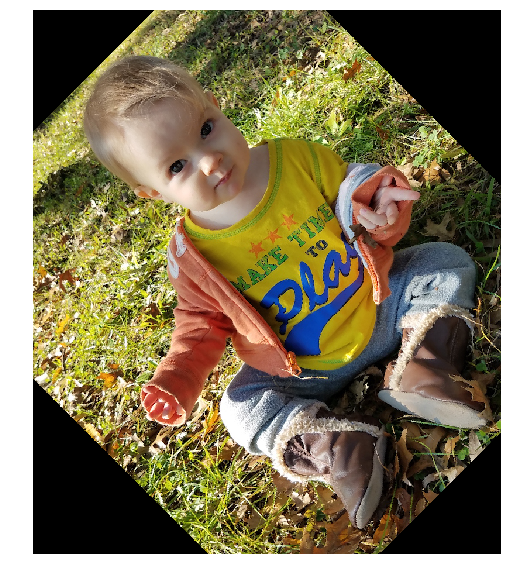

In [71]:
uli_45 = uli.rotate(45)
img_show(uli_45)

### More Generic Transforms

We apply an <em>affine</em> transform matrix to the image, or rather, the first two rows of a 3x3 matrix to convolve over the image, and, depending on the values in that matrix, wind up with scaled, translated, rotated, or sheared images. Below, given the affine matrix $$\begin{bmatrix}1 & -0.5 & 0 \\ 0 & 1 & 0 \\ 0 & 0 & 1\end{bmatrix}$$ we shear the Uli photo:

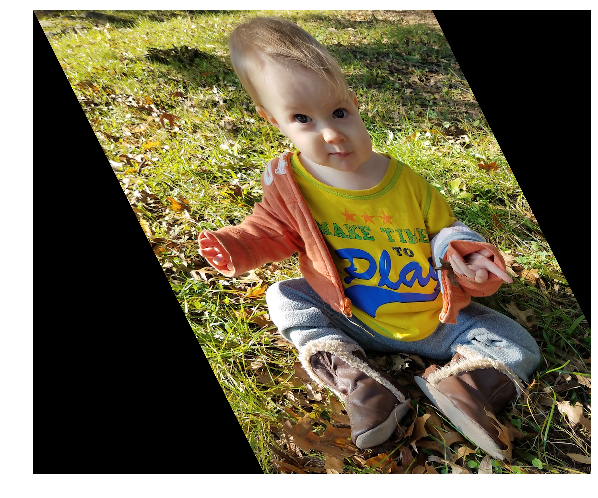

In [75]:
uli_shear = uli.transform((int(1.4*uli.width), uli.height), Image.AFFINE, data=(1, -0.5, 0, 0, 1, 0))
img_show(uli_shear)

And now we'll perform a perspective transformation on the image, supplying `Image.PERSPECTIVE` rather than `Image.AFFINE`

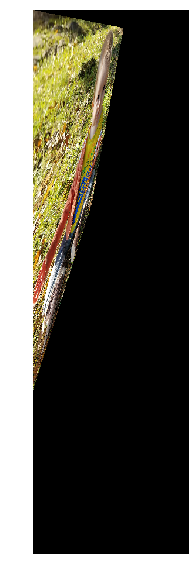

In [84]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
uli_perspective = uli.transform((uli.width//3, uli.height), Image.PERSPECTIVE, 
                               params, Image.BICUBIC)
img_show(uli_perspective)

### Computing Basic Statistics of an Image

Using the stat module....

In [85]:
s = stat.Stat(uli)
print(s.extrema)  # min/max pixel values for each channel

[(0, 255), (0, 255), (0, 255)]


In [86]:
print(s.count)

[744000, 744000, 744000]


In [87]:
print(s.mean)

[127.97486155913978, 114.42697446236559, 70.83561424731182]


In [88]:
print(s.stddev)

[67.17743591627027, 64.42490339941179, 57.716449991628394]


Let's plot the histograms of the bands

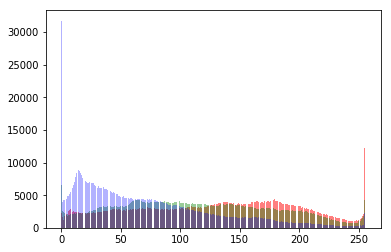

In [93]:
pl = uli.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

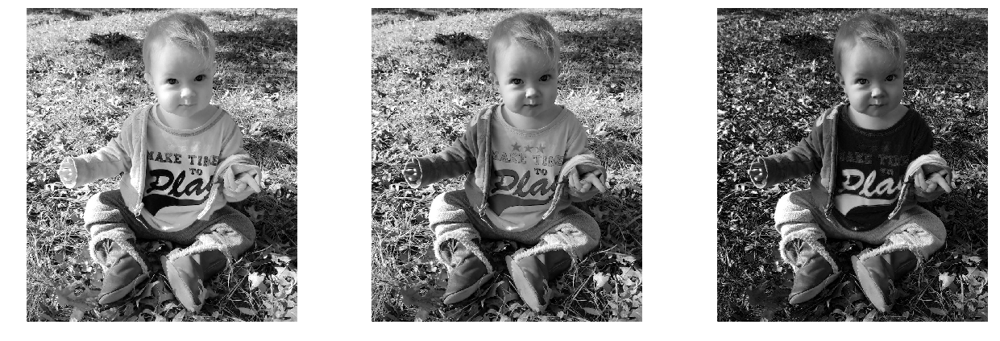

In [95]:
from matplotlib import pylab as plb
ch_r, ch_g, ch_b = uli.split()
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(ch_r, cmap=plb.cm.Reds)
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(ch_g, cmap=plb.cm.Greens)
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(ch_b, cmap=plb.cm.Blues)
plt.axis('off')
plt.tight_layout()
plt.show()

For funsies, we'll swap the red and blue channels

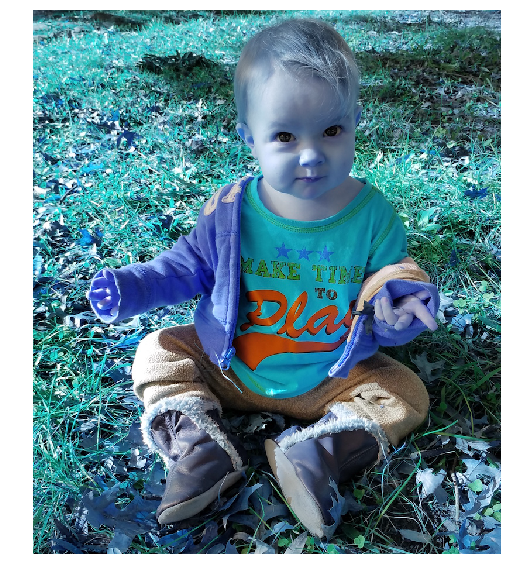

In [97]:
uli_bgr = Image.merge('RGB', (ch_b, ch_g, ch_r))
img_show(uli_bgr)